# "Simbología y mapas coropléticos con PyQGIS"
> "Aprende a automatizar la elaboración de mapas coropléticos en QGIS usando Python"
- toc: true
- badges: true
- comments: true
- categories: [qgis, python, pyqgis, mapas]
- permalink: /pyqgis-mapa-coropletico/

> Elaborado por Juan Javier Santos Ochoa ([@jjsantoso](https://twitter.com/jjsantoso))

# Introducción
Los mapas coropléticos son una de las formas más comunes de presentar información geográfica. En QGIS se pueden hacer mapas muy sencillos o también se puede lograr [diseños más complejos](https://www.qgistutorials.com/es/docs/making_a_map.html), sin embargo, una desventaja de usar este software para crear un mapa coroplético es que normalmente es un proceso lento que requiere de muchos pasos (comparado con hacerlo en R o Python, por ejemplo). Si esta tarea se realiza manualmente entonces se requiere de mucho esfuerzo para hacer varios mapas en serie. Y si ya hiciste los mapas pero solo quieres cambiar un elemento, como por ejemplo, la paleta de colores, entonces habría que editar nuevamente cada uno de ellos. 

Afortunadamente con PyQGIS es posible crear mapas usando código de Python, lo que puede reducir la carga de trabajo y automatizar ciertos pasos que nos ahorren tiempo. Aun así desde ahora advierto: **hacer mapas coropléticos, y en general, manejar la simbología de capas con PyQGIS no es una tarea fácil**. Se requiere de un buen conocimiento sobre cómo funciona PyQGIS. Y aún sabiendo de PyQGIS, hacer un mapa coroplético conlleva muchos pasos, por lo que hay que evaluar bien si vale la pena invertir tiempo en programar todo un proceso para generar estos mapas. Yo por ejemplo, lo encontré útil porque estaba haciendo un proceso iterativo en el que editaba manualmente algunos shapefiles y luego quería ver rápidamente el resultado en un mapa coroplético. Como necesitaba hacer esto muchas veces, valió la pena hacer la inversión de tiempo en automatizar los mapas, pero si en tu caso solo necesitas hacer pocos mapas, yo recomendaría hacerlo manual o usar otras alternativas más rápidas.

Esta entrada será larga, porque se requiere entender muchos conceptos para poder llegar a hacer algo tan sencillo como un mapa coroplético en QGIS. Y ya aprovechando la explicación, voy a exponer en general el tema de la simbología de capas y a mostrar varios ejemplos. Esta entrada de hecho la hago más para mí cuando vuelva a necesitar esto en el futuro.

Si no conoces de PyQGIS, puedes revisar la entrada que escribí al respecto: [Introducción a PyQGIS (Python + QGIS)](/intro-pyqgis/)

# Configuración inicial

Esta entrada la escribo desde un ambiente de conda (en Windows 10), tal como expliqué en la entrada [Integración de PyQGIS con Jupyter Lab usando Anaconda](/pyqgis-anaconda), aunque el código debería funcionar igual en la consola de Python integrada dentro de QGIS (si no tiene mucha esperiencia, recomiendo usar la consola integrada). Si también quieres correr este código desde un ambiente de conda, entonces debes correr el siguiente código al inicio de tu script:

In [1]:
#collapse
from qgis.core import QgsApplication
from IPython.display import Image
qgs = QgsApplication([], False)
qgs.initQgis()

>Warning: si usas la consola de Python dentro de QGIS entonces no es necesario ejecutar el código anterior

Con el siguiente código vamos a importar las librerías que necesitamos y además voy a definir algunas funciones auxiliares que me ayudarán a exportar los resultados y poder incluirlos en este notebook. Más adelante explicaremos lo que hace cada función, por ahora simplemente basta con definirlas.

In [2]:
import os
from qgis.core import *
from PyQt5.QtGui import QColor
from PyQt5.QtCore import QSize, Qt
from qgis.PyQt.QtGui import QFont

dir_data = "datos"


def create_layout_with_map(layer, scale_factor=1):

    layout = QgsPrintLayout(proyecto)
    layout.initializeDefaults()

    page = layout.pageCollection().page(0)
    pagesize = page.pageSize()

    mapa = QgsLayoutItemMap(layout)
    extent = layer.extent()
    # Set map item position and size (by default, it is a 0 width/0 height item placed at 0,0)
    margin_y = 10
    layout_height = pagesize.height() - 2 * margin_y
    layout_width = min(layout_height * (extent.width() / extent.height()), 2 * pagesize.width())
    margin_x = (pagesize.width() / 2) - (layout_width / 2)
    mapa.attemptMove(QgsLayoutPoint(margin_x, margin_y, QgsUnitTypes.LayoutMillimeters))
    mapa.attemptResize(QgsLayoutSize(layout_width, layout_height, QgsUnitTypes.LayoutMillimeters))
    mapa.setExtent(extent)
    mapa.setScale(mapa.scale() * scale_factor)
    layout.addLayoutItem(mapa)
    return layout


def add_legend_to_layout(layout, title='', pos_x=15, pos_y=10):
    mapa = layout.referenceMap()
    legend = QgsLayoutItemLegend(layout)
    legend.setLinkedMap(mapa)  # map is an instance of QgsLayoutItemMap
    layout.addLayoutItem(legend)
    legend.attemptMove(QgsLayoutPoint(pos_x, pos_y, QgsUnitTypes.LayoutMillimeters))
    legend.setTitle(title)


def export_image(layout, img_path: str, dpi: int = 100):
    exporter = QgsLayoutExporter(layout)
    exp_sett = QgsLayoutExporter.ImageExportSettings()
    exp_sett.dpi = dpi
    exporter.exportToImage(img_path, exp_sett)

>Tip: si trabajas desde un Jupyter Notebook, puedes también definir la siguiente función y de esta manera puedes revisar cómo queda el resultado después de ejecutar alguna instrucción con `show_image(layer)`, donde `layer` es la capa que queremos visualizar.

In [3]:
#collapse
def show_image(layer, scale_factor=1, dpi=50, legend_title=''):
    os.makedirs('images', exist_ok=True)
    img_path = 'images/simbologia.png'
    layout = create_layout_with_map(layer, scale_factor=scale_factor)
    add_legend_to_layout(layout, title=legend_title)
    export_image(layout, img_path, dpi=dpi)
    return Image(img_path, width=600)

Vamos cargar una capa que contiene las colonias de la CDMX. Los datos que uso se pueden [descargar desde aquí](https://s3.us-east-2.amazonaws.com/jjsantoso.com/blog/datos/datos.zip). Tras ejecutar el código deberíamos observar simplemente la capa ya cargada. Todos los polígonos se verán de un mismo color.

In [4]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

nombre_layer_colonias = "colonias_cdmx"
layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp", nombre_layer_colonias)
proyecto.addMapLayer(layer_colonias)

<QgsVectorLayer: 'colonias_cdmx' (ogr)>

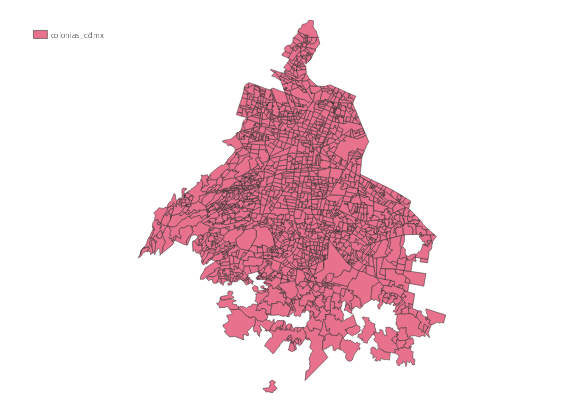

In [5]:
#hide_input
show_image(layer_colonias)

# Resumen mapas coropléticos

Esta entrada es muy larga y requiere tiempo procesar todo lo que aquí trato de explicar. Si lo que buscas concretamente es cómo hacer un mapa coroplético a partir de una capa que contiene una variable contínua y además añadir la leyenda correspondiente y que se exporte a una imagen en formato .png, entonces voy a resumir esa tarea en la siguiente función (además de las funciones definidas anteriormente):

In [6]:
def create_choropleth(layer: QgsVectorLayer, value_field: str, num_classes: int = 5, classification_method='Quantile',
                      ramp_name: str = 'Spectral', img_path: str = 'image.png'):
    """
    Genera un mapa coroplético de la capa `layer`, usando la variable `value_field`. El resultado es exportado a `img_path`
    `layer`: es la capa que queremos representar en el mapa.
    `value_field`: es el nombre la variable continua que nos interesa representar en el mapa. Los polígonos tendrán un color asignado de acuerdo con el valor que tengan en esta variable.
    `num_classes`: es el número de categorías en que queremos dividir los valores de la variable en value_field.
    `classification_method`: es el método con el que se formarán los intervalos para conformar las categorías señaladas por `num_classes`. Las opciones pueden ser: 'Quantile', 'EqualInterval', 'Logarithmic', 'Jenks', 'Pretty', 'StdDev'
    `ramp_name`: es el nombre de la paleta de colores que se usará.
    `img_path`: ruta y nombre del archivo donde se guardará la imagen generada.
    """

    proyecto.removeAllMapLayers()
    proyecto.addMapLayer(layer)
    default_style = QgsStyle().defaultStyle()
    color_ramp = default_style.colorRamp(ramp_name)

    renderer = QgsGraduatedSymbolRenderer()
    renderer.setClassAttribute(value_field)
    classification_method_instance = QgsClassificationMethodRegistry().method(classification_method)
    renderer.setClassificationMethod(classification_method_instance)
    renderer.updateClasses(layer, num_classes)
    renderer.updateColorRamp(color_ramp)
    layer.setRenderer(renderer)

    layout = create_layout_with_map(layer)
    add_legend_to_layout(layout, title=value_field)
    export_image(layout, img_path)

La función anterior tiene 6 parámetros que vienen explicados en la descripción de la misma. Para nuestro ejemplo, vamos a representar la variable `POB2010` que es la población de cada colonia. Escogimos representar en 5 clases, usando el método de clasificación de Jenks y la paleta de colores `Spectral`. Así se ejecuta y se ve el resultado:

In [7]:
layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp", nombre_layer_colonias)
img_path = 'images/choropleth.png'

create_choropleth(layer=layer_colonias, value_field='POB2010', num_classes=5, classification_method='Jenks',
                  ramp_name='Spectral', img_path=img_path)

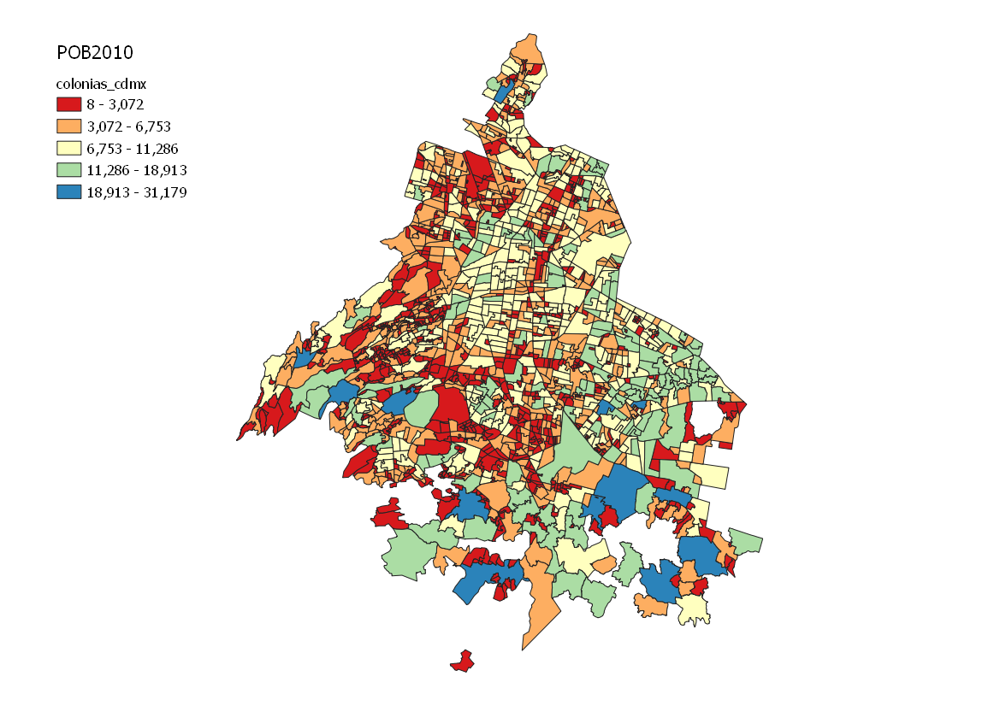

In [8]:
#hide_input
Image(img_path, width=600)

* Los campos disponibles de la capa `layer_colonias` son:

In [9]:
layer_colonias.fields().toList()

[<QgsField: ENT (String)>,
 <QgsField: CVEDT (String)>,
 <QgsField: NOMDT (String)>,
 <QgsField: DTTOLOC (String)>,
 <QgsField: CVEUT (String)>,
 <QgsField: NOMUT (String)>,
 <QgsField: POB2010 (String)>,
 <QgsField: ID (Integer)>]

* Las opciones disponibles para `ramp_name` se puede consultar con el siguiente comando:

In [10]:
QgsStyle().defaultStyle().colorRampNames()

['Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'GnBu',
 'Greens',
 'Greys',
 'Inferno',
 'Magma',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'Plasma',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Viridis',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd']

* Las opciones para `classification_method` son: 

In [11]:
list(QgsClassificationMethodRegistry().methodNames().values())

['Quantile', 'EqualInterval', 'Logarithmic', 'Jenks', 'Pretty', 'StdDev']

Usemos la función en otro ejemplo con otros inputs:

In [12]:
layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp", nombre_layer_colonias)
create_choropleth(layer=layer_colonias, value_field='ID', num_classes=10, classification_method='Pretty',
                  ramp_name='Plasma', img_path=img_path)

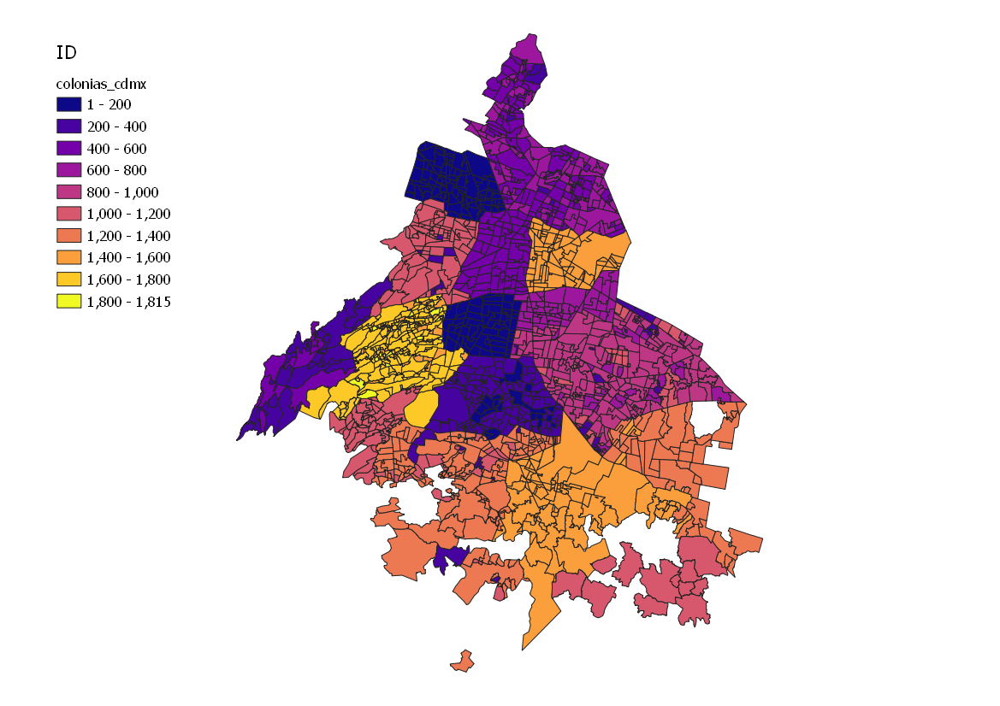

In [13]:
#hide_input
Image(img_path, width=600)

* O incluso podemos cambiar la capa, usando la de mercados públicos de la CDMX y representando la variable `SUPERF_M2` que es la superficie en metros cudrados.

In [14]:
layer_mercados = QgsVectorLayer(f"{dir_data}/mercados/mercados_publicos.geojson")
create_choropleth(layer=layer_mercados, value_field='SUPERF_M2 ', num_classes=5, classification_method='Quantile',
                  ramp_name='RdYlBu', img_path=img_path)

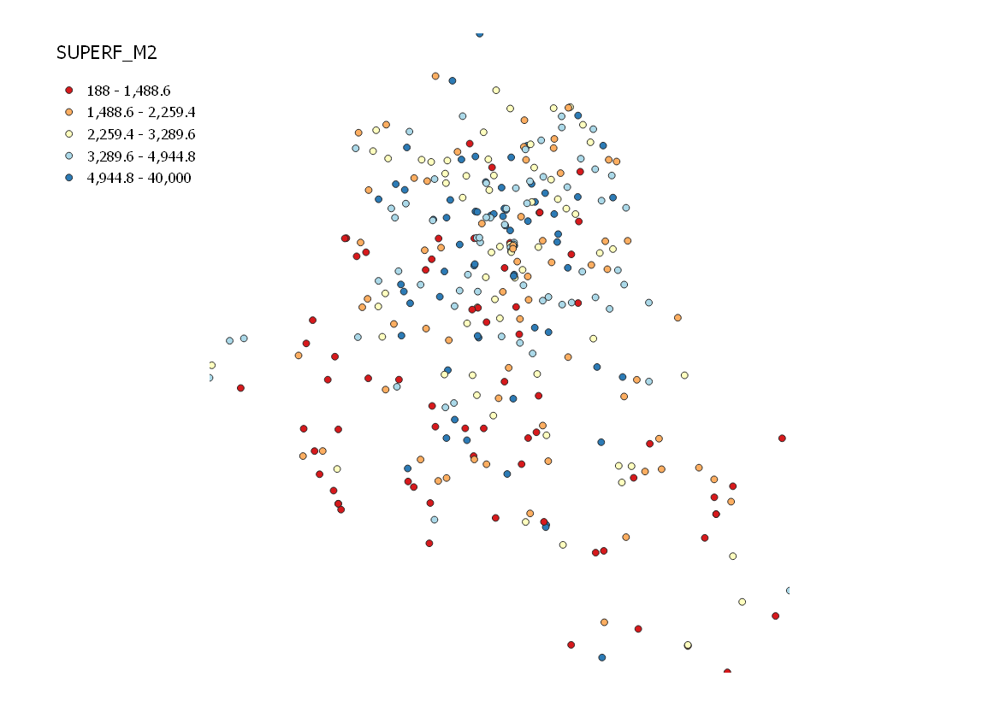

In [15]:
#hide_input
Image(img_path, width=600)

Para resumir y dimensionar lo que hemos hecho, pongamos en un script todo el código necesario para hacer un mapa coroplético en PyQGIS:

```python
import os
from qgis.core import *

dir_data = "datos"
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

def create_layout_with_map(layer, scale_factor=1):

    layout = QgsPrintLayout(proyecto)
    layout.initializeDefaults()

    page = layout.pageCollection().page(0)
    pagesize = page.pageSize()

    mapa = QgsLayoutItemMap(layout)
    extent = layer.extent()
    # Set map item position and size (by default, it is a 0 width/0 height item placed at 0,0)
    margin_y = 10
    layout_height = pagesize.height() - 2 * margin_y
    layout_width = min(layout_height * (extent.width() / extent.height()), 2 * pagesize.width())
    margin_x = (pagesize.width() / 2) - (layout_width / 2)
    mapa.attemptMove(QgsLayoutPoint(margin_x, margin_y, QgsUnitTypes.LayoutMillimeters))
    mapa.attemptResize(QgsLayoutSize(layout_width, layout_height, QgsUnitTypes.LayoutMillimeters))
    mapa.setExtent(extent)
    mapa.setScale(mapa.scale() * scale_factor)
    layout.addLayoutItem(mapa)
    return layout


def add_legend_to_layout(layout, title='', pos_x=15, pos_y=10):
    mapa = layout.referenceMap()
    legend = QgsLayoutItemLegend(layout)
    legend.setLinkedMap(mapa)  # map is an instance of QgsLayoutItemMap
    layout.addLayoutItem(legend)
    legend.attemptMove(QgsLayoutPoint(pos_x, pos_y, QgsUnitTypes.LayoutMillimeters))
    legend.setTitle(title)


def export_image(layout, img_path: str, dpi: int = 100):
    exporter = QgsLayoutExporter(layout)
    exp_sett = QgsLayoutExporter.ImageExportSettings()
    exp_sett.dpi = dpi
    exporter.exportToImage(img_path, exp_sett)


def create_choropleth(layer: QgsVectorLayer, value_field: str, num_classes: int = 5, classification_method='Quantile',
                      ramp_name: str = 'Spectral', img_path: str = 'image.png'):
    """
    Genera un mapa coroplético de la capa `layer`, usando la variable `value_field`. El resultado es exportado a `img_path`
    `layer`: es la capa que queremos representar en el mapa.
    `value_field`: es el nombre la variable continua que nos interesa representar en el mapa. Los polígonos tendrán un color asignado de acuerdo con el valor que tengan en esta variable.
    `num_classes`: es el número de categorías en que queremos dividir los valores de la variable en value_field.
    `classification_method`: es el método con el que se formarán los intervalos para conformar las categorías señaladas por `num_classes`. Las opciones pueden ser: 'Quantile', 'EqualInterval', 'Logarithmic', 'Jenks', 'Pretty', 'StdDev'
    `ramp_name`: es el nombre de la paleta de colores que se usará.
    `img_path`: ruta y nombre del archivo donde se guardará la imagen generada.
    """

    proyecto.removeAllMapLayers()
    proyecto.addMapLayer(layer)
    default_style = QgsStyle().defaultStyle()
    color_ramp = default_style.colorRamp(ramp_name)

    renderer = QgsGraduatedSymbolRenderer()
    renderer.setClassAttribute(value_field)
    classification_method_instance = QgsClassificationMethodRegistry().method(classification_method)
    renderer.setClassificationMethod(classification_method_instance)
    renderer.updateClasses(layer, num_classes)
    renderer.updateColorRamp(color_ramp)
    layer.setRenderer(renderer)

    layout = create_layout_with_map(layer)
    add_legend_to_layout(layout, title=value_field)
    export_image(layout, img_path)
    
layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp")
img_path = 'images/choropleth.png'

create_choropleth(layer=layer_colonias, value_field='POB2010', num_classes=5, classification_method='Jenks',
                  ramp_name='Spectral', img_path=img_path)

```

Creo que con esto cualquiera que haya hecho un mapa coroplético manualmente en QGIS o programando en R o Python saldría espantado por lo difícil que resulta hacer el mapa coroplético más sencillo con PyQGIS. Y esto apenas empieza, porque entender el código escrito requiere de entender bien QGIS y PyQGIS. A continuación trataré de explicar cómo funciona la simbología en QGIS.

# Rendererizador, símbolos y capas de símbolos

La simbología se refiere al aspecto visual de una capa de vectorial. En la documentación de QGIS hay un apartado que explica en detalle las propiedades de simbología: https://docs.qgis.org/3.16/es/docs/user_manual/working_with_vector/vector_properties.html#symbology-properties. Voy a tratar de resumir aquí lo más relevante para después poder replicarlo con PyQGIS.

Echemos un vistazo a la interfaz gráfica para configurar la simbología de una capa. En QGIS, al hacer clic derecho sobre una capa, seleccionamos la opción `propiedades` en el menú y luego seleccionamos la pestaña `simbología`. Veremos el siguiente menú.

En la imagen he señalado los tres componentes más importantes para definir una simbología:
* **[Rendererizador (Renderer)](https://docs.qgis.org/3.16/es/docs/user_manual/working_with_vector/vector_properties.html#features-rendering)**: es el responsable de dibujar una entidad junto con el símbolo correcto. Un renderer puede tener varios símbolos.
* **[Símbolo (Symbol)](https://docs.qgis.org/3.16/es/docs/user_manual/style_library/symbol_selector.html#symbol-selector)**: es cómo se va a representar visualmente cada entidad. Un símbolo puede contener varias capas de símbolos.
* **[Capa de símbolo (SymbolLayer)](https://docs.qgis.org/3.16/es/docs/user_manual/style_library/symbol_selector.html#the-symbol-layer)**: son representaciones gráficas individuales que se superponen para conformar un símbolo.

De las definiciones anteriores no queda muy claro qué hace cada componente, pero ya lo iremos viendo cón más detalle.

![Ventana simbología](images/simbologia_overview_2.png)

Hay varios tipos de renderers. Si hacemos clic en el menú donde ahora aparece "Símbolo único" veremos más opciones: Categorizado, Graduado, Basado en reglas, Objetos mezclados, etc. Cada uno de ellos se usa para representar diferentes situaciones.

![](images/simbologia_renderers.png)

El renderer de símbolo único es el que viene por default y simplemente sirve para representar todos los polígonos de un mismo estilo. Podemos ver que su symbol es un relleno de color gris con bordes negros, y la symbolLayer es igual, un relleno simple de color gris.

Si yo cambiara el renderer y seleccionara uno de tipo "Categorizado", entonces tendría que seleccionar una variable categórica (NOMDT) y para cada categoría de esa variable se creará un símbolo, cada uno de un color diferente.

![](images/simbologia_renderer_categorizado.png)

En PyQGIS podemos obtener el renderer de una capa vectorial usando el método `.renderer()`. Carguemos nuevamente la capa de colonias

In [16]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()
layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp", nombre_layer_colonias)
proyecto.addMapLayer(layer_colonias)

<QgsVectorLayer: 'colonias_cdmx' (ogr)>

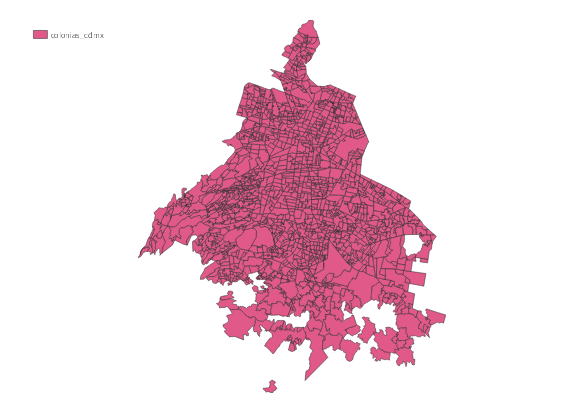

In [17]:
#hide_input
show_image(layer_colonias)

Y ahora obtenemos el renderer y vemos su tipo:

In [18]:
renderer = layer_colonias.renderer()
print(renderer.type())

singleSymbol


Como podemos ver, este objeto renderer por default es de tipo `singleSymbol`, que es los mismo que "Símbolo único". 

Podemos obtener el objeto símbolo de este renderer con el método `.symbol()`. Es objeto symbol tiene algunas pocas propiedades como color, opacidad, unidad de medida y tipo de símbolo.

>Tip: En QGIS hay [3 tipos de símbolos principalmente](https://qgis.org/api/classQgsSymbol.html):

    * QgsMarkerSymbol: representa puntos
    * QgsLineSymbol: representa líneas
    * QgsFillSymbol: representa áreas

In [19]:
symbol = renderer.symbol()
print("color=", symbol.color().name(), "Opacidad=", symbol.opacity(), "Unidad de medida=", symbol.outputUnit(), "Tipo de símbolo=", symbol.type())

color= #e15989 Opacidad= 1.0 Unidad de medida= 0 Tipo de símbolo= 2


Nosotros podemos cambiar estos atributos, por ejemplo, vamos a cambiar el color y la opacidad de la capa original:

In [20]:
symbol.setColor(QColor("green"))
symbol.setOpacity(0.3)
layer_colonias.triggerRepaint()

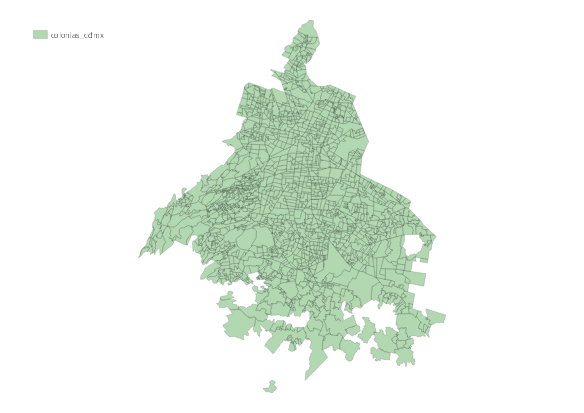

In [21]:
#hide_input
show_image(layer_colonias)

Ahora bien, como mencioné en la definición, los objetos symbol están conformados de objetos SymbolLayer y podemos obtener estos últimos con el método `symbol.symbolLayer(pos)`, donde pos, es la posisión del objeto symbolLayer que queremos recuperar.
>Tip: puedes usar el método `symbol.symbolLayerCount()` para saber cuantos SymbolLayer hay. O también el método `symbol.symbolLayers()` retorna una lista con todos los objetos.

In [22]:
symbolLayer = symbol.symbolLayer(0)
symbolLayer

Podemos ver que el objeto es de tipo [`QgsSimpleFillSymbolLayer`](https://qgis.org/pyqgis/3.2/core/Simple/QgsSimpleFillSymbolLayer.html). Si volvemos a dar un vistazo en la interfaz gráfica de QGIS, podemos ver que al seleccionar un symbolLayer ("Relleno simple") aparecen varias opciones para ajustar la apariencia, como el color, el estilo de relleno (brushStyle), color, ancho y estilo de la línea de borde (stroke), entre otros. Obviamente estas son características que podemos ver y cambiar usando PyQGIS.

>Tip: Podemos consultar los tipos de symbolLayer disponibles además de `SimpleFill` con el siguiente comando:

In [23]:
#collapse
QgsApplication.symbolLayerRegistry().symbolLayersForType(symbol.type())

['CentroidFill',
 'GeometryGenerator',
 'GradientFill',
 'LinePatternFill',
 'PointPatternFill',
 'RandomMarkerFill',
 'RasterFill',
 'SVGFill',
 'ShapeburstFill',
 'SimpleFill']

![](images/simbologia_symbollayer_simple.png)

In [24]:
print("Estilo de relleno=", symbolLayer.brushStyle(), "Color=", symbolLayer.color().name(), "Anchura de marca=", symbolLayer.strokeWidth())

Estilo de relleno= 1 Color= #008000 Anchura de marca= 0.26


Vamos a cambiar el estilo, grosor y color de la línea de borde y además vamos a cambiar el relleno para que en lugar de que sea un relleno liso, tenga un patrón de líneas horizontales.

In [25]:
symbolLayer.setStrokeStyle(3)
symbolLayer.setStrokeWidth(1)
symbolLayer.setStrokeColor(QColor('Blue'))
symbolLayer.setBrushStyle(Qt.HorPattern)
layer_colonias.triggerRepaint()

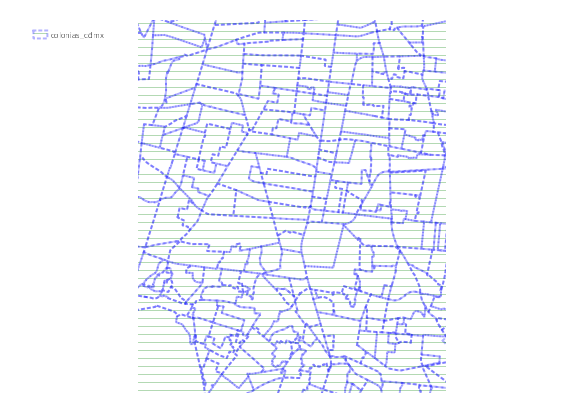

In [26]:
#hide_input
show_image(layer_colonias, scale_factor=0.2)

Con esto nos podemos dar cuenta que es al nivel de SymbolLayer donde tenemos más control de la apariencia de una capa.

Hasta el momento he dicho que es posible que un símbolo tenga varios simbolLayers, pero quizá no ha quedado claro cómo se ve esto. Para ejemplificarlo volvamos a la interfaz gráfica para configurar la simbología. Podemos ver que en la parte inferior ya hay varios estilos predefinidos, por ejemplo "outline red" o "pattern dot blue". Si uno selecciona alguno de estos, en la ventana se muestra el símbolo y los symbollayers que lo componen. Al seleccionar el estilo "pattern dot blue" podemos ver que consta de 2 symbolLayer: "Línea simple" y "Relleno de patrón en Punto". Lo que esto significa es que el símbolo final estará conformado por la superposición de las líneas de borde los polígonos y un relleno de puntos. Uno podría configurar las características de las líneas y de los puntos por separado, cada uno tiene atributos particulares.

![](images/simbologia_symbollayer_multiple.png)

Ahora para ejemplificar esto usando PyQGIS, en el código a continuación vamos a crear un nuevo símbolo (de tipo `QgsFillSymbol`) y vamos a añadirle dos symbolLayer (líneas=`QgsSimpleLineSymbolLayer` y puntos=`QgsPointPatternFillSymbolLayer`). Configuramos algunos atributos para controlar la apariencia de los puntos y luego establecemos el símbolo para el renderer con el método `renderer.setSymbol(mySymbol2)`. El resultado se ve igual al que obtendríamos con la interfaz gráfica.

In [27]:
mySymbol2 = QgsFillSymbol()
symbol_layer_line = QgsSimpleLineSymbolLayer.create()
symbol_layer_points = QgsPointPatternFillSymbolLayer.create()
symbol_layer_points.setDistanceX(2.4)
symbol_layer_points.setDistanceY(2.4)
symbol_layer_points.subSymbol().setSize(0.6)

mySymbol2.changeSymbolLayer(0, symbol_layer_line)
mySymbol2.appendSymbolLayer(symbol_layer_points)
mySymbol2.setColor(QColor('#377eb8'))
renderer.setSymbol(mySymbol2)

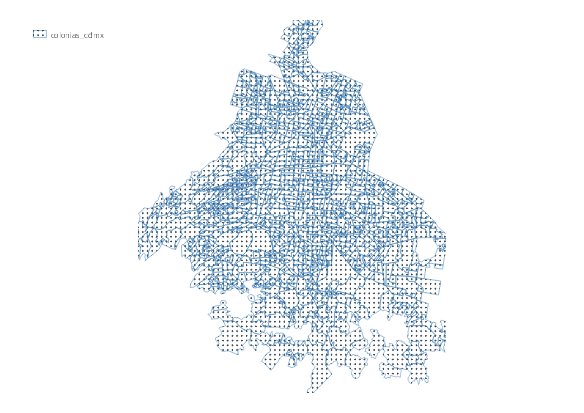

In [28]:
#hide_input
show_image(layer_colonias, scale_factor=0.9)

Podemos confirmar que el símbolo consta de 2 symbolLayers:

In [29]:
mySymbol2.symbolLayers()

# Mapas coropléticos (Render graduado)

Entendiendo un poco mejor el tema de los renderizadores, símbolos y capas de símbolos, volvemos al tema de los mapas coropléticos. Un mapa coroplético se genera usando un renderizador de símbolo graduado `QgsGraduatedSymbolRenderer()`. Este tipo de renderer requiere de varios atributos para funcionar:

* `renderer.setClassAttribute(value_field)`: el nombre de la variable que se va a representar.
* `renderer.setClassificationMethod`: es el método con el que se formarán los intervalos para conformar las categorías.
* `renderer.updateClasses`: es el número de categorías en que queremos dividir los valores de la variable value_field.
* `renderer.updateColorRamp`: es la paleta de colores que se usará.

Por último actualizamos el renderer de la capa vectorial con `layer_colonias.setRenderer(renderer)`

In [30]:
ramp_name = 'Spectral'
value_field = 'POB2010'
num_classes = 5
classification_method = QgsClassificationJenks()

default_style = QgsStyle().defaultStyle()
color_ramp = default_style.colorRamp(ramp_name)

renderer = QgsGraduatedSymbolRenderer()
renderer.setClassAttribute(value_field)
renderer.setClassificationMethod(classification_method)
renderer.updateClasses(layer_colonias, num_classes)
renderer.updateColorRamp(color_ramp)

layer_colonias.setRenderer(renderer)

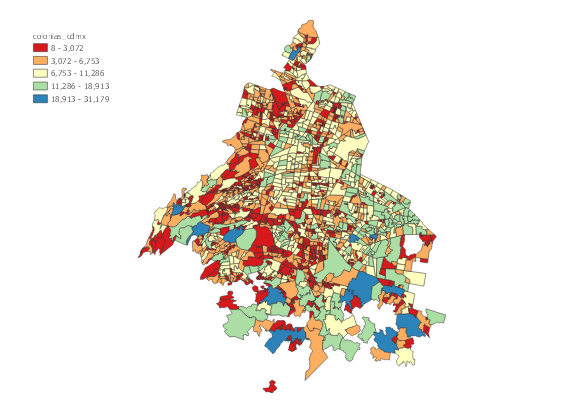

In [31]:
#hide_input
show_image(layer_colonias)

Con esto ya tenemos el mapa elaborado, sin embargo hace falta agregarle detalles y exportarlo a formato imagen (o PDF). Para eso, en QGIS hay que hacer un diseño de impresión o composición.

# Diseño de impresión

Voy a tomar aquí la definición de lo que permite hacer el diseño de impresión (o composición) como viene en la [documentación de QGIS](https://docs.qgis.org/3.16/es/docs/user_manual/print_composer/overview_composer.html):
> El diseño de impresión proporciona capacidades de diseño e impresión cada vez mayores. Le permite agregar elementos como el lienzo del mapa QGIS, etiquetas de texto, imágenes, leyendas, barras de escala, formas básicas, flechas, tablas de atributos y marcos HTML. Puede dimensionar, agrupar, alinear, colocar y rotar cada elemento y ajustar sus propiedades para crear su diseño. El diseño se puede imprimir o exportar a formatos de imagen, PostScript, PDF o SVG. Puede guardar el diseño como plantilla y volver a cargarlo en otra sesión. Finalmente, la generación de varios mapas basados en una plantilla se puede hacer a través del generador de atlas.

En PyQGIS una nueva composición se crea con la función `QgsPrintLayout(proyecto)` a partir de un objeto tipo proyecto. El objeto creado lo nombramos como layout y lo inicializamos con los parámetros por default (tamaño de hoja, rotación, etc). Luego iremos añadiendo elementos a esta composición.

In [32]:
layout = QgsPrintLayout(proyecto)
layout.initializeDefaults()

## Mapa

Para añadir un mapa usamos la función `QgsLayoutItemMap(layout)`, usando el objeto `layout`. Es necesario darle un tamaño al mapa ya que por default tiene alto y ancho iguales a 0. Esto se hace con la función `mapa.attemptResize()` en el que especifico las dimensiones (en milimétros) que tendrá el mapa. También se debe establecer la extensión del mapa (`mapa.setExtent(extent)`), es decir el área geográfica que se quiere mostrar. Lo otro que se debe configurar es la escala del mapa (`mapa.setScale(mapa.scale() * 1.05)`). En este caso escribí una expresión que calcula de forma semi-automática cuál debe ser la dimensión, extensión y escala del mapa a partir de la capa vectorial. Para un diseño más personalizado se pueden proveer todos estos parámetros de forma manual y controlar a detalle la posición y escala del mapa.

In [33]:
mapa = QgsLayoutItemMap(layout)
page = layout.pageCollection().page(0)
pagesize = page.pageSize()
extent = layer_colonias.extent()
margin_y = 10
layout_height = pagesize.height() - 2 * margin_y
layout_width = min(layout_height * (extent.width() / extent.height()), 2 * pagesize.width())
margin_x = (pagesize.width() / 2) - (layout_width / 2)
mapa.attemptMove(QgsLayoutPoint(margin_x, margin_y, QgsUnitTypes.LayoutMillimeters))
mapa.attemptResize(QgsLayoutSize(layout_width, layout_height, QgsUnitTypes.LayoutMillimeters))
mapa.setExtent(extent)
mapa.setScale(mapa.scale() * 1.05)
layout.addLayoutItem(mapa)

Ahora sí podemos exportar este mapa a un archivo png, lo que haremos con el siguiente código. 

In [34]:
img_path = 'images/simbologia.png'
os.makedirs('images/', exist_ok=True)
exporter = QgsLayoutExporter(layout)
exporter.exportToImage(img_path,  QgsLayoutExporter.ImageExportSettings())

0

Se debe haber guardado el archivo `images/simbologia.png` que luce así:

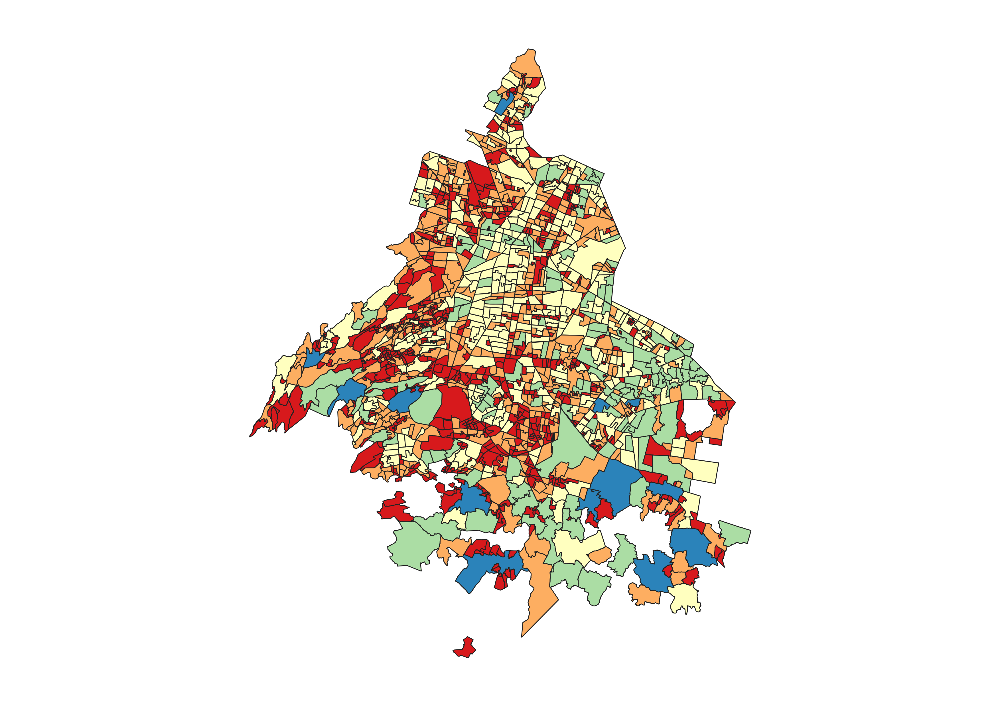

In [35]:
#hide_input
Image(img_path, width=600)

A este mapa le falta una leyenda que especifique qué significan los colores.

## Leyenda

Para agregar una leyenda usamos la función `QgsLayoutItemLegend(layout)` y la vinculamos con el mapa que queremos que represente usando `legend.setLinkedMap(mapa)`. En el código también se hacen algunos ajustes a la posición y al título de la leyenda. Finalmente volvemos a exportar la imagen y vemos cómo va.

In [36]:
legend = QgsLayoutItemLegend(layout)
legend.setLinkedMap(mapa)
layout.addLayoutItem(legend)
legend.attemptMove(QgsLayoutPoint(15, 10, QgsUnitTypes.LayoutMillimeters))
legend.setTitle('Población 2010')

exporter.exportToImage(img_path,  QgsLayoutExporter.ImageExportSettings())

0

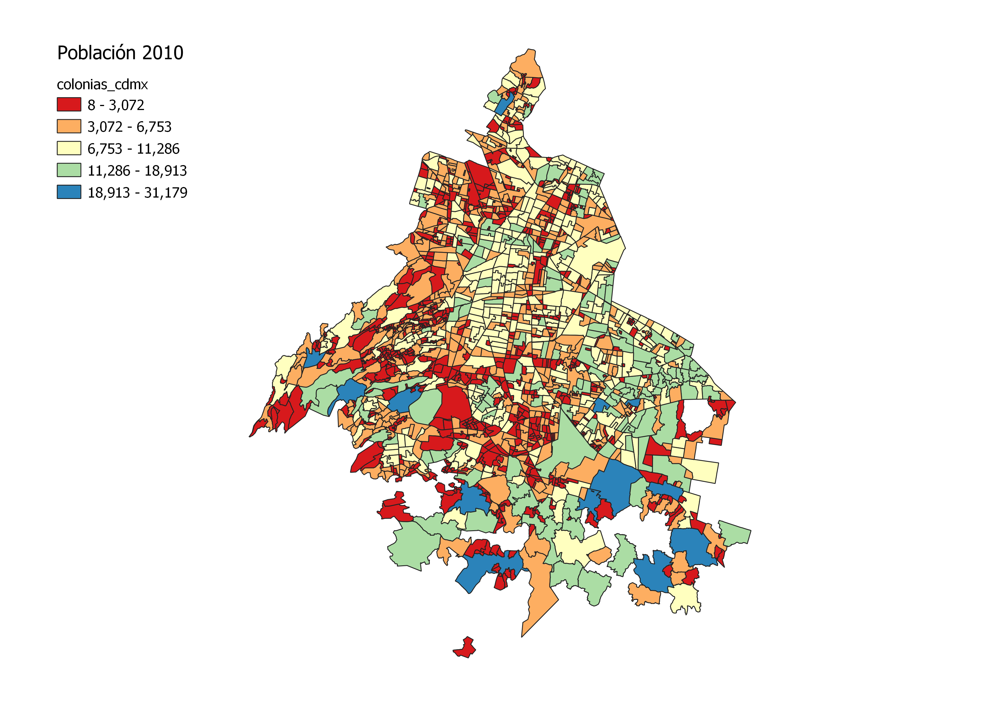

In [37]:
#hide_input
Image(img_path, width=600)

## Texto

También podemos añadirle etiquetas de texto a la composición. Por ejemplo, podemos añadirle un título y una fuente.

In [38]:
title = QgsLayoutItemLabel(layout)
title.setText("Ciudad de México")
title.setFont(QFont("Arial", 20, QFont.Bold))
title.adjustSizeToText()
title.attemptMove(QgsLayoutPoint(120, 2, QgsUnitTypes.LayoutMillimeters))
layout.addLayoutItem(title)

fuente = QgsLayoutItemLabel(layout)
fuente.setText("Fuente: Datos abiertos de la Ciudad de México (https://datos.cdmx.gob.mx/)")
fuente.setFont(QFont("Arial", 10))
fuente.adjustSizeToText()
fuente.attemptMove(QgsLayoutPoint(10, 200, QgsUnitTypes.LayoutMillimeters))
layout.addLayoutItem(fuente)
exporter.exportToImage(img_path,  QgsLayoutExporter.ImageExportSettings())

0

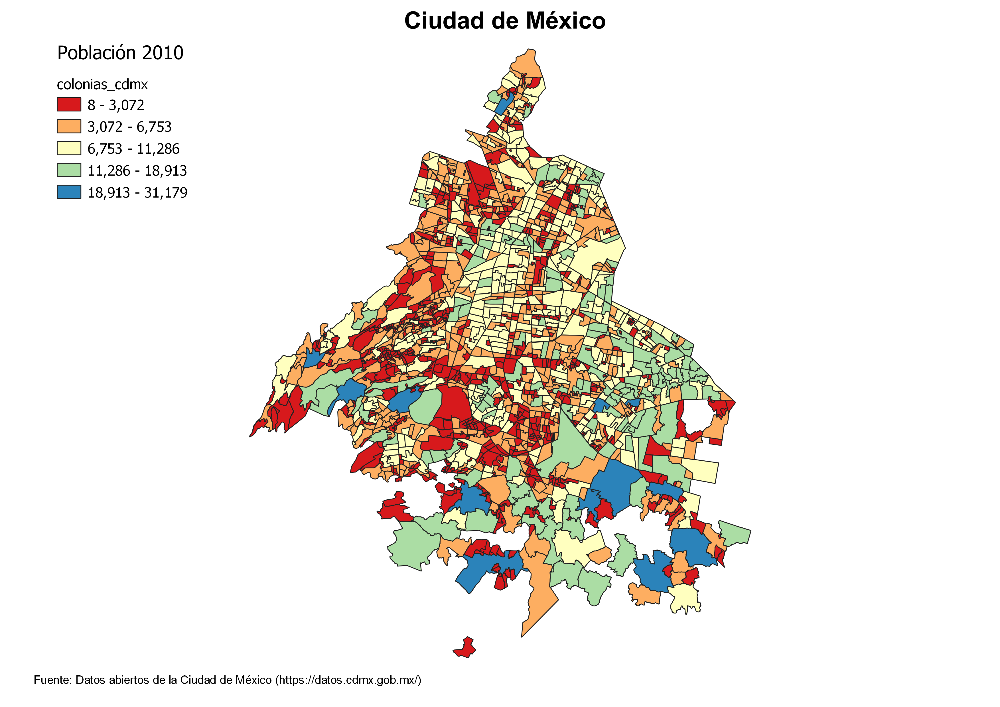

In [39]:
#hide_input
Image(img_path, width=600)

## Barra de escala

Podemos añadir una barra de escala para dimensionar el tamaño real del mapa. Esto lo hacemos con la función `QgsLayoutItemScaleBar(layout)`. 

In [40]:
scale = QgsLayoutItemScaleBar(layout)
scale.setLinkedMap(mapa)
scale.setStyle('Single Box')
scale.applyDefaultSize(QgsUnitTypes.DistanceMeters)
scale.setMapUnitsPerScaleBarUnit(1000.0)
scale.setNumberOfSegments(4)
scale.setUnitsPerSegment(1000.0)
scale.setUnitLabel("Km")
layout.addLayoutItem(scale)
scale.attemptMove(QgsLayoutPoint(70, 140, QgsUnitTypes.LayoutMillimeters))
exporter.exportToImage(img_path,  QgsLayoutExporter.ImageExportSettings())

0

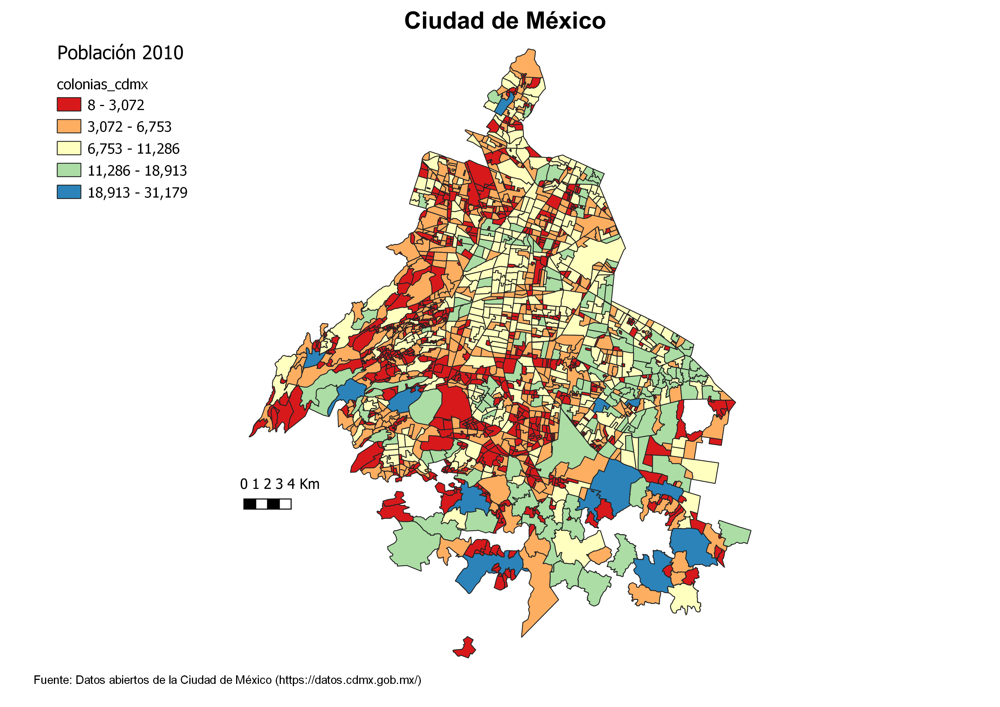

In [41]:
#hide_input
Image(img_path, width=600)

## Guarda Layout

El mapa se puede seguir personalizando y añadiendo más detalles. Lo cierto es que parece más fácil hacer algunos ajustes de forma manual que por medio de PyQGIS. La buena noticia es que podemos guardar la composición dentro de un proyecto de QGIS y luego exportarlo a un archivo de proyecto (`proyecto_simbologia.qgz`). De esta manera podemos abrir este archivo con la interfaz gráfica de QGIS y seguir editando manualmente la composicion (con el administrador de composiciones).

In [42]:
manager = proyecto.layoutManager()
layoutName = "Mi composicion"
layout.setName(layoutName)
manager.addLayout(layout)
proyecto.write('proyecto_simbologia.qgz')

True

De igual forma, es posible leer un archivo de proyecto que contenga composiciones ya creadas y podemos editarlas con PyQGIS.

# Ejemplos otros renderers

El objetivo de esta entrada era llegar a tener una idea de cómo configurar renderers, símbolos y capas de símbolos para generar la apariencia de una capa vectorial. Con lo visto hasta aquí ya tenemos una mejor idea de cómo hacerlo con PyQGIS. Aparte de los que vimos, existen varios tipos de renderers y símbolos que no me alcanzaría el tiempo para explicar todos, pero a continuación dejaré el código de algunos que posiblemente pueden ser útiles.

## Renderer Categórico

Es útil cuando queremos asignar el color según los valores de una variable categórica, por ejemplo, el nombre de las alcaldías de la Ciudad de México

In [43]:
field = 'NOMDT'
unique_values = layer_colonias.uniqueValues(layer_colonias.fields().lookupField(field))
categories = [QgsRendererCategory(value, QgsSymbol.defaultSymbol(layer_colonias.geometryType()), str(value)) for value in unique_values]

categorized_renderer = QgsCategorizedSymbolRenderer(field, categories)
categorized_renderer.updateColorRamp(QgsStyle().defaultStyle().colorRamp('Reds'))
layer_colonias.setRenderer(categorized_renderer)

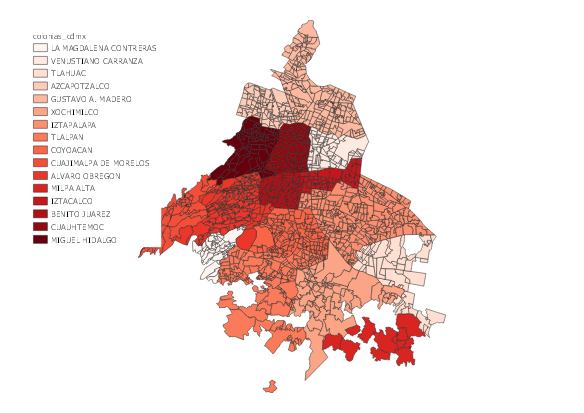

In [44]:
#hide_input
show_image(layer_colonias)

## Graduado por rangos

Es como el renderer graduado con el que hicimos el mapa coroplético, pero en este caso nosotros definimos rangos personalizados para la variable de interés ('POB2010') y también les asignamos símbolos que definimos nosotros mismos.

In [45]:
graduated_renderer = QgsGraduatedSymbolRenderer()
graduated_renderer.setClassAttribute('POB2010')

poly_symbol_1 = QgsFillSymbol()
poly_symbol_2 = QgsFillSymbol()
poly_symbol_1.setColor(QColor('green'))
poly_symbol_2.setColor(QColor('blue'))

graduated_renderer.addClassRange(QgsRendererRange(QgsClassificationRange('0-10000 hab', 0, 10000), poly_symbol_1))
graduated_renderer.addClassRange(QgsRendererRange(QgsClassificationRange('10001 o más hab', 10001, 200000), poly_symbol_2))

layer_colonias.setRenderer(graduated_renderer)
layer_colonias.triggerRepaint()

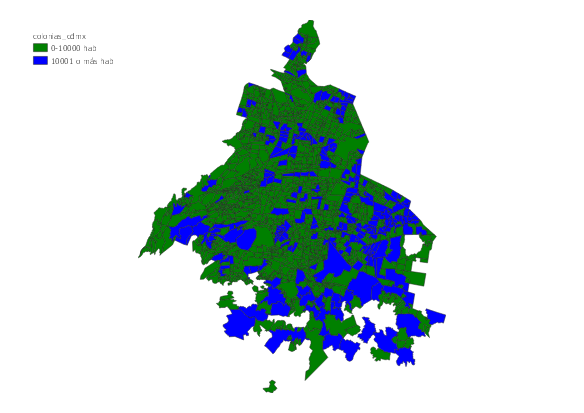

In [46]:
#hide_input
show_image(layer_colonias)

## Renderer Simple con puntos aleatorios

Este es bien interesante porque permite rellenar un polígono con puntos aleatorios. En este caso por ejemplo, estoy especificando 3 puntos dentro de cada polígono.

In [47]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp", nombre_layer_colonias)
proyecto.addMapLayer(layer_colonias)

renderer = layer_colonias.renderer()

mySymbol = QgsFillSymbol.createSimple({'style': 'no'})
symbol_layer_aleatorio = QgsRandomMarkerFillSymbolLayer.create()
symbol_layer_aleatorio.setPointCount(3)
mySymbol.appendSymbolLayer(symbol_layer_aleatorio)
renderer.setSymbol(mySymbol)

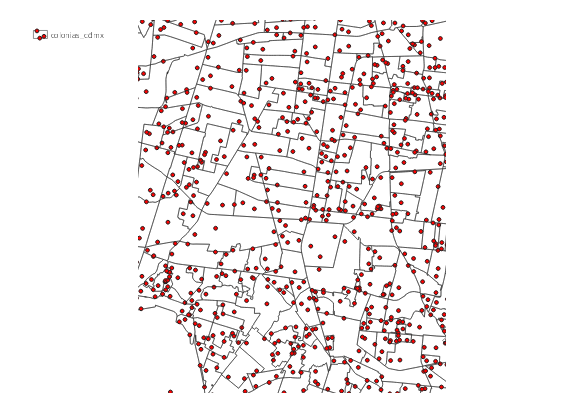

In [48]:
#hide_input
show_image(layer_colonias, scale_factor=0.2)

Aún más interesante es que podemos hacer que el número de puntos dentro de cada polígono dependa de algún atributo de la entidad, por ejemplo aquí a contibuación estoy especificando que el número de puntos esté determinado por la expresion `"POB2010"/1000`, que indica que habrá un punto por cada 1000 personas en cada colonia.

In [49]:
mySymbol = QgsFillSymbol.createSimple({'style': 'no'})
symbol_layer_aleatorio = QgsRandomMarkerFillSymbolLayer.create()
exp = '("POB2010"/1000)'
symbol_layer_aleatorio.setDataDefinedProperty(QgsSymbolLayer.PropertyPointCount, QgsProperty.fromExpression(exp) )
mySymbol.appendSymbolLayer(symbol_layer_aleatorio)
renderer.setSymbol(mySymbol)

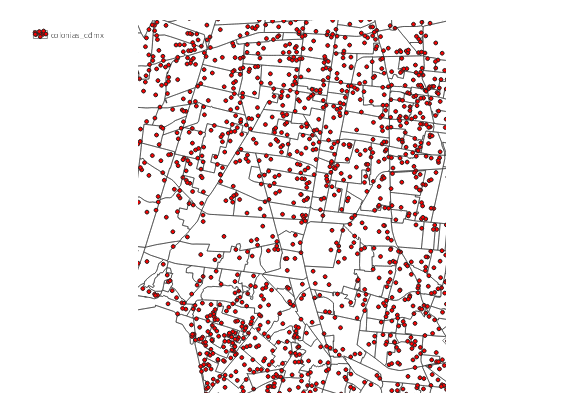

In [50]:
#hide_input
show_image(layer_colonias, scale_factor=0.2)

Y aún todavía mejor que lo anterior, es posible generar múltiples capas de símbolos aleatorios para mostrar más de una cantidad. Por ejemplo, si yo quisiera mostrar resultados electorales por distritos, podría usar puntos de color rojo para mostrar la votación de un partido político y de verde los de algún otro partido, algo parecido a lo que describí en [mi entrada sobre mapas de puntos en Python](/mapas-distribucion-puntos/). En el ejemplo a continuación, estoy asignando el 66% de los puntos al interior de cada polígono al color rojo y el 34% restante al color verde.

In [51]:
mySymbol = QgsFillSymbol.createSimple({'style': 'no'})
# Simbollayer 1
symbol_layer_aleatorio_1 = QgsRandomMarkerFillSymbolLayer.create()
exp_1 = '("POB2010"/1000) * 0.66'
symbol_layer_aleatorio_1.setDataDefinedProperty(QgsSymbolLayer.PropertyPointCount, QgsProperty.fromExpression(exp_1) )
mySymbol.appendSymbolLayer(symbol_layer_aleatorio_1)

# Simbollayer 2
symbol_layer_aleatorio_2 = QgsRandomMarkerFillSymbolLayer.create()
symbol_layer_aleatorio_2.setColor(QColor('#00ffae'))
exp_2 = '("POB2010"/1000) * 0.34'
symbol_layer_aleatorio_2.setDataDefinedProperty(QgsSymbolLayer.PropertyPointCount, QgsProperty.fromExpression(exp_2) )
mySymbol.appendSymbolLayer(symbol_layer_aleatorio_2)

renderer.setSymbol(mySymbol)

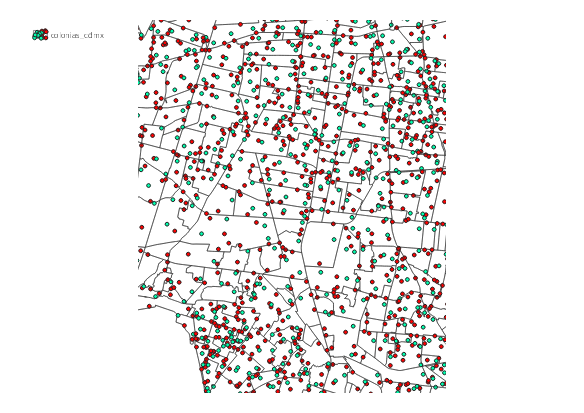

In [52]:
#hide_input
show_image(layer_colonias, scale_factor=0.2)

## Renderer basado en reglas

En este tipo de renderer uno puede crear reglas de forma bastante flexible y asignar un símbolo a cada categoría de observaciones que cumpla con la condición impuesta. En el ejemplo de abajo, estoy especificando una regla para señalar de color naranja las colonias que empiezan con la palabra "San" y en azul las que tienen nombre que inicia con "Santa".

In [53]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

layer_colonias = QgsVectorLayer(f"{dir_data}/colonias_iecm_2019/mgpc_2019.shp", nombre_layer_colonias)
proyecto.addMapLayer(layer_colonias)

rule_renderer = QgsRuleBasedRenderer(QgsSymbol.defaultSymbol(layer_colonias.geometryType()))
root_rule = rule_renderer.rootRule()

rule_1 = root_rule.children()[0].clone()
rule_1.setFilterExpression('regexp_match("NOMUT", \'^SAN\\b\')')
rule_1.symbol().setColor(QColor("Orange"))
rule_1.setLabel('Empieza con San')
root_rule.appendChild(rule_1)

rule_2 = root_rule.children()[0].clone()
rule_2.setFilterExpression('regexp_match("NOMUT", \'^SANTA\\b\')')
rule_2.symbol().setColor(QColor("Blue"))
rule_2.setLabel('Empieza con Santa')
root_rule.appendChild(rule_2)

root_rule.removeChildAt(0)
layer_colonias.setRenderer(rule_renderer)

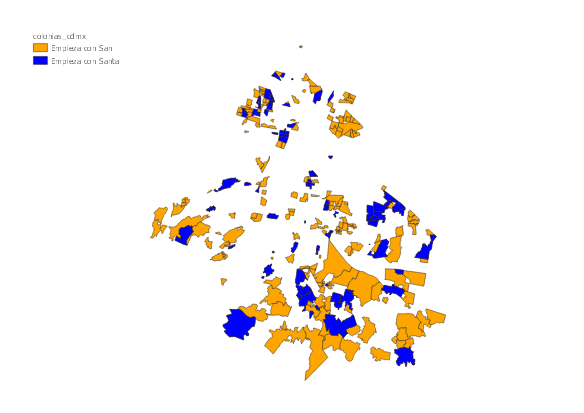

In [54]:
#hide_input
show_image(layer_colonias)

## Renderer Heatmap Puntos

Hasta el momento solo vimos renderers para capas de polígonos, que la mayoría también funciona para puntos. Pero, los puntos también tienen renderers especialmente para este tipo de capas. Una de las más interesantes el de heatmap, que permite ver la concentración de puntos en un área. Por ejemplo, para la capa de mercados públicos de la CDMX tenemos:

In [55]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

nombre_layer_mercados = "mercados"
layer_mercados = QgsVectorLayer(f"{dir_data}/mercados/mercados_publicos.geojson", nombre_layer_mercados)
proyecto.addMapLayer(layer_mercados)

heatmap = QgsHeatmapRenderer()
heatmap.setRadius(10)
heatmap.setColorRamp(QgsStyle().defaultStyle().colorRamp('Reds'))
layer_mercados.setRenderer(heatmap)
layer_mercados.triggerRepaint()

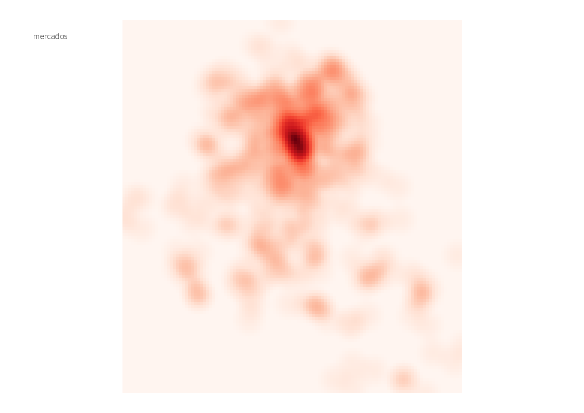

In [56]:
#hide_input
show_image(layer_mercados)

## Render categóricos puntos

Este es similar al renderer categórico que vimos para polígonos, pero en este caso aplicado a puntos.

In [57]:
nombre_layer_mercados_2 = "mercados_2"
if not proyecto.mapLayersByName(nombre_layer_mercados_2):
    layer_mercados_2 = QgsVectorLayer(f"{dir_data}/mercados/mercados_publicos.geojson", nombre_layer_mercados_2)
    proyecto.addMapLayer(layer_mercados_2)

field = 'TAMAÑO1'
unique_values = layer_mercados_2.uniqueValues(layer_mercados_2.fields().lookupField(field))
categories = [QgsRendererCategory(value, QgsSymbol.defaultSymbol(layer_mercados_2.geometryType()), str(value)) for value in unique_values]

categorized_renderer = QgsCategorizedSymbolRenderer(field, categories)
categorized_renderer.updateColorRamp(QgsStyle().defaultStyle().colorRamp('Spectral'))
layer_mercados_2.setRenderer(categorized_renderer)

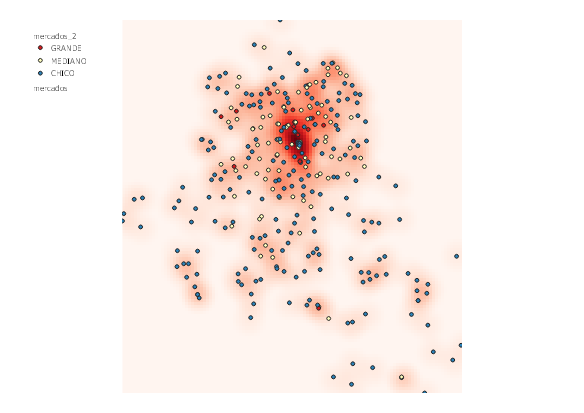

In [58]:
#hide_input
show_image(layer_mercados_2)

## Renderer único por tamaño

En este caso tenemos un renderer de símbolo único, todos son puntos del mismo color, pero lo que variamos es el tamaño de los puntos. Para lograr esto usamos el método `symbol_layer.setDataDefinedProperty(QgsSymbolLayer.PropertySize, QgsProperty.fromExpression(exp) )`, donde le especificamos al symbolLayer que el tamaño del punto estará dado por la expresión `scale_linear("NUM_LOCALE", 0, 1000, 0.5, 4)`, que indica que calcule el tamaño de forma lineal usando la variable `NUM_LOCALE`, para valores entre 0 y 1000, y que el valor mínimo le asigne un tamaño de 0.5 y al valor máximo un tamaño de 4.

In [59]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

dir_data = "datos"
nombre_layer_mercados = "mercados"
if not proyecto.mapLayersByName(nombre_layer_mercados):
    layer_mercados = QgsVectorLayer(f"{dir_data}/mercados/mercados_publicos.geojson", nombre_layer_mercados)
    proyecto.addMapLayer(layer_mercados)

renderer = layer_mercados.renderer()
symbol_layer = renderer.symbol().symbolLayer(0)
exp = 'scale_linear("NUM_LOCALE", 0, 1000, 0.5, 4)'
symbol_layer.setDataDefinedProperty(QgsSymbolLayer.PropertySize, QgsProperty.fromExpression(exp) )
layer_mercados.setRenderer(renderer)

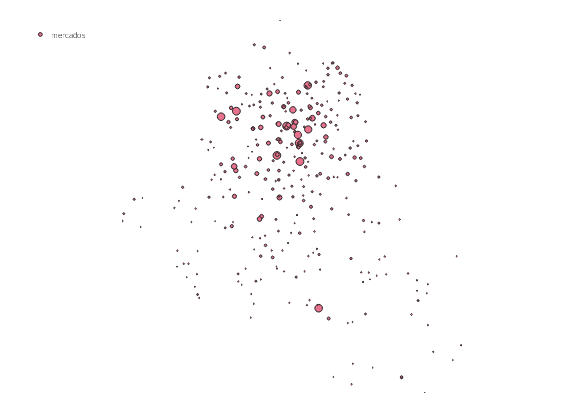

In [60]:
#hide_input
show_image(layer_mercados)

## Renderer Clúster puntos

Este es otro muy interesante, porque muestra con un punto grande el número de puntos que se agrupan en un misma área. Así a diferentes niveles de zoom, va cambiando el número de puntos reunidos.

In [61]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

dir_data = "datos"
nombre_layer_mercados = "mercados"
if not proyecto.mapLayersByName(nombre_layer_mercados):
    layer_mercados = QgsVectorLayer(f"{dir_data}/mercados/mercados_publicos.geojson", nombre_layer_mercados)
    proyecto.addMapLayer(layer_mercados)

cluster_renderer = QgsPointClusterRenderer()
cluster_renderer.setTolerance(5)
layer_mercados.setRenderer(cluster_renderer)

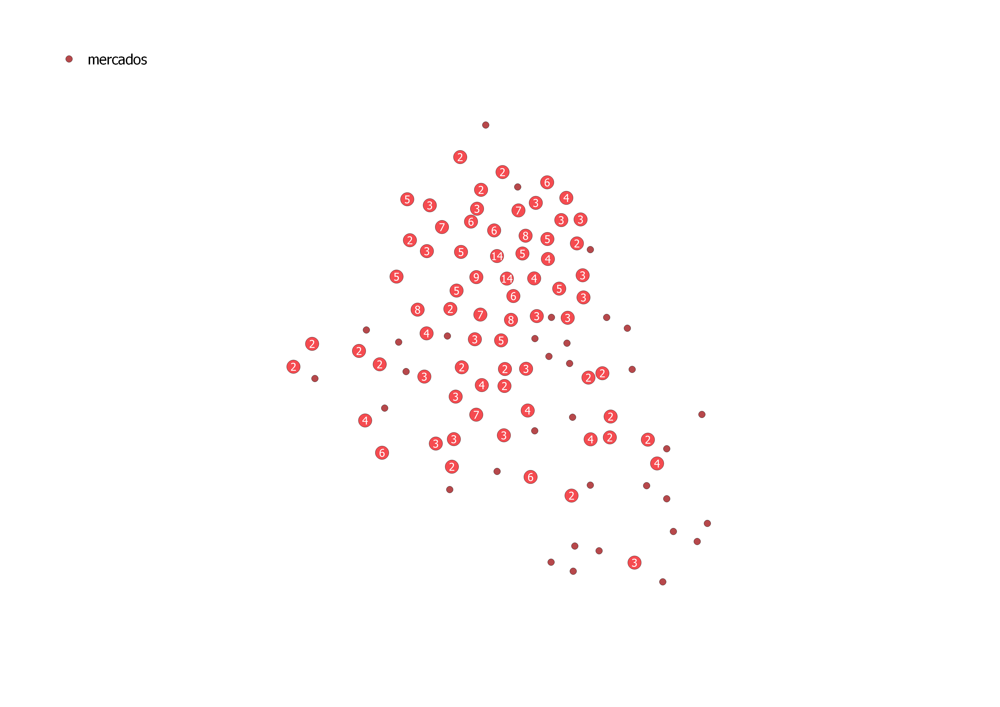

In [62]:
#hide_input
show_image(layer_mercados, dpi=300, scale_factor=1.4)

A un nivel de zoom más cercano se ven diferentes los puntos reunidos.

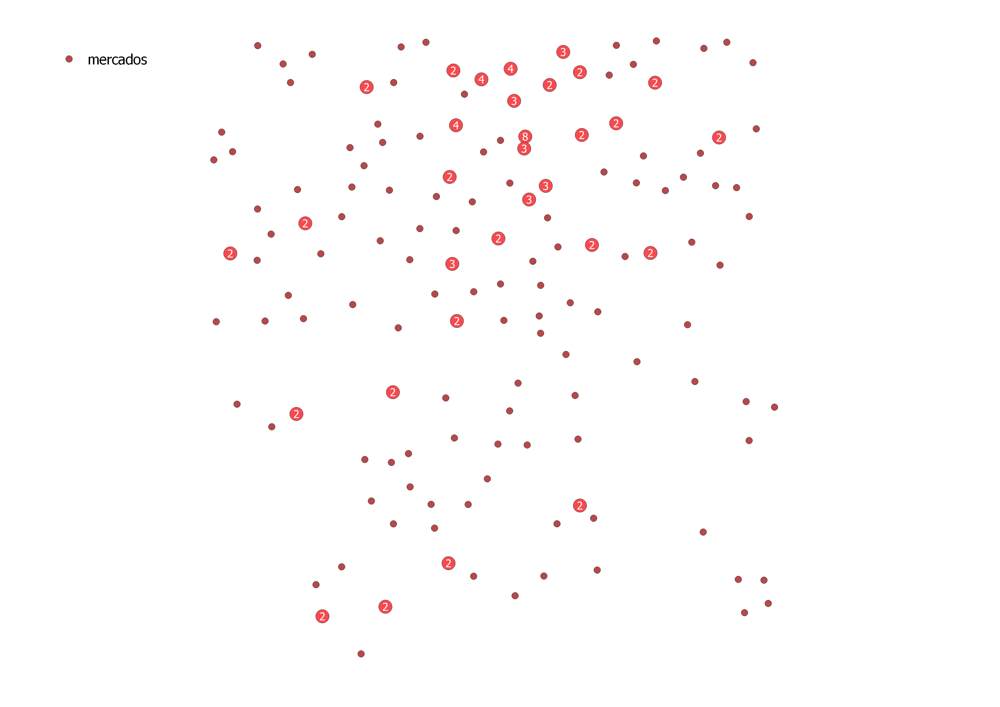

In [63]:
#hide_input
show_image(layer_mercados, scale_factor=0.5, dpi=300)

## Renderer desplazamiento de punto

Este renderer no me queda tan claro cómo funciona, pero en principio, evita que se sobrepongan los puntos que están en una misma posición y los organiza en círculos concéntricos para que se vean todos.

In [64]:
proyecto = QgsProject.instance()
proyecto.removeAllMapLayers()

dir_data = "datos"
nombre_layer_mercados = "mercados"
if not proyecto.mapLayersByName(nombre_layer_mercados):
    layer_mercados = QgsVectorLayer(f"{dir_data}/mercados/mercados_publicos.geojson", nombre_layer_mercados)
    proyecto.addMapLayer(layer_mercados)

cluster_renderer = QgsPointDisplacementRenderer()
cluster_renderer.setTolerance(5)
layer_mercados.setRenderer(cluster_renderer)

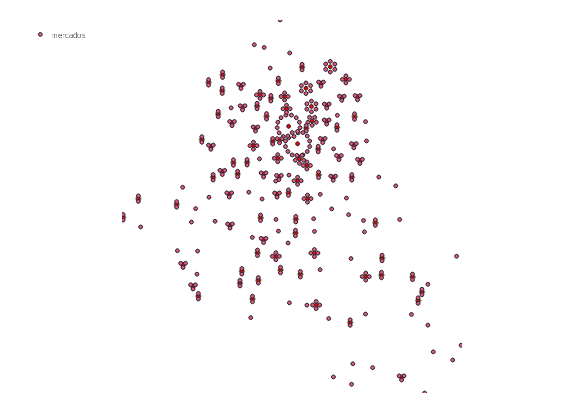

In [65]:
#hide_input
show_image(layer_mercados)

In [66]:
#hide_input
qgs.exitQgis()

# Revisa otras entradas de este blog:
* [Integración de PyQGIS con Jupyter Lab usando Anaconda](/pyqgis-anaconda)
* [Introducción a PyQGIS (Python + QGIS)](/intro-pyqgis/)
* [Mapas de puntos con Python](/mapas-distribucion-puntos/)
* [Introducción a bases de datos relacionales y SQL para científicos sociales](/intro-sql-sociales/)
* [Recuadros para mapas en Geopandas](/zoom-mapas-geopandas/)
* [Etiquetado de variables y valores en las encuestas de INEGI usando Python](/etiquetas-encuestas-inegi/)
* [Generando archivos de Excel con formatos y gráficas usando Python](/excel-formato-graficas/)
* [Trabajando con archivos de Excel complejos en Pandas](/pandas-excel/)

# Referencias

* https://docs.qgis.org/3.16/en/docs/pyqgis_developer_cookbook/vector.html#further-topics
* https://docs.qgis.org/3.16/en/docs/pyqgis_developer_cookbook/composer.html#output-using-print-layout
* https://www.geodose.com/2022/02/pyqgis-tutorial-automating-map-layout.html
* https://anitagraser.com/pyqgis-101-introduction-to-qgis-python-programming-for-non-programmers/pyqgis-101-styling-vector-layers/
* https://anitagraser.com/pyqgis-101-introduction-to-qgis-python-programming-for-non-programmers/pyqgis-101-exporting-layouts/